# Feature Visualization of CIFAR-10 Classifier
In this notebook, I explore the process of creating meaningful representations of the features in a classificator I pre-trained. The dataset used for training the classsifier is CIFAR-10.

## Setup & Imports
I start by importing PyTorch and other libraries used across the notebook as well as setting a random seed for reproducibility.
The device is set to be 'cuda', if available, for GPU optimization.

In [1]:
import torch
import torchvision.utils as vutils
from utils import *
import gc
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image as ImageLib
from models import *

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)

g = torch.Generator()
g.manual_seed(42)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

## Data Preparation
I load the CIFAR-10 dataset (which is split into 5 files), apply normalization, shuffle the dataset, and split it for training, validation, and testing.

In [2]:
images = np.zeros((5, 10000, 3, 32, 32), dtype=np.float32)
labels = np.zeros((5, 10000), dtype=np.int64)
for i in range(5):
    with open(f"cifar-10-batches-py/data_batch_{i+1}", 'rb') as file:
        data = pickle.load(file, encoding = 'latin1')
        images[i] = np.array(data['data']).reshape(-1, 3, 32, 32) / 255.0
        labels[i] = np.array(data['labels'])


images = images.reshape(-1, 3, 32, 32)
labels = labels.reshape(-1)

# Split the dataset
tr_images, tmp_images, tr_labels, tmp_labels = train_test_split(images, labels, train_size = 0.8, random_state = 42, stratify = labels)
dev_images, tst_images, dev_labels, tst_labels = train_test_split(tmp_images, tmp_labels, train_size = 0.5, random_state = 42, stratify = tmp_labels)

# Convert into torch tensors
tr_images = torch.from_numpy(tr_images).float()
tr_labels = torch.from_numpy(tr_labels)
dev_images = torch.from_numpy(dev_images).float()
dev_labels = torch.from_numpy(dev_labels)
tst_images = torch.from_numpy(tst_images).float()
tst_labels = torch.from_numpy(tst_labels)

# Create a dataloader for training
tr_dataset = torch.utils.data.TensorDataset(tr_images, tr_labels)
tr_dataloader = torch.utils.data.DataLoader(tr_dataset, batch_size = 128, shuffle = True, generator = g)

I load the pre-trained classifier.

In [3]:
net = Classifier(32)
net.load_state_dict(torch.load("cnn_classifier.pth"))
net = net.to(device)

The code below defines a function to capture the outputs of specific layers during the forward pass using hooks. This will be useful for visualizing the features learned by the network.

In [4]:
layers = {}
def capture(name, apply_relu=False):
    def hook(module, input, output):
        if apply_relu:
            output = torch.nn.functional.relu(output)
        layers[name] = output
    
    return hook

## Optimization in the Pixel Space
Below I attempt to optimize an input image to maximize the output neuron corresponding to a the class 'airplane'.

In [5]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)

g = torch.Generator()
g.manual_seed(42)

In [6]:
class Image(torch.nn.Module):
    def __init__(self, image_size):
        super(Image, self).__init__()
        self.image = torch.nn.Parameter(torch.randn(3, image_size, image_size))
        self.image_size = image_size

    def forward(self):
        out = self.image.view(1, 3, self.image_size, self.image_size) 
        return out

In [7]:
image = Image(32).to(device)
image.train()

Image()

In [8]:
image_optimizer = torch.optim.Adam(image.parameters(), lr = 0.001)

In [9]:
net.eval()
for i in range(20000):
    image_optimizer.zero_grad()
    net.zero_grad()
    
    img = image()
    img = img.to(device)

    output = torch.nn.functional.softmax(net(img), dim=1)

    diff_x = img[:, :, :, 1:] - img[:, :, :, :-1]
    diff_y = img[:, :, 1:, :] - img[:, :, :-1, :]
    diffs = torch.cat([
        diff_x.reshape(img.size(0), -1),
        diff_y.reshape(img.size(0), -1)
    ], dim=1)

    var = diffs.var(dim=1).mean()
    below_0 = torch.relu(-img).mean()
    above_1 = torch.relu(img - 1).mean()

    loss = torch.exp(-output[0, 0]) + var * 0.01 + below_0 + above_1
    loss.backward()
    
    image_optimizer.step()

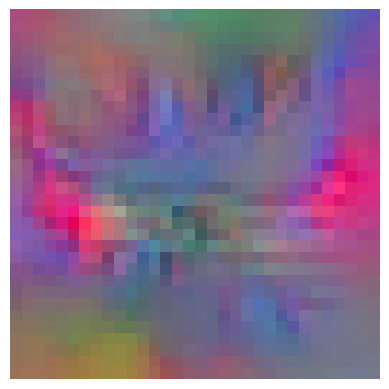

In [10]:
final_img = image().detach().cpu()
plt.imshow(np.transpose(vutils.make_grid(final_img, normalize=True, scale_each=True).cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

## Optimization in the Latent Space of a Decoder
Since optimizing in the pixel space directly lead to noisy and uninterpretable results, I will use a pre-trained decoder on CIFAR-10 to map latent vectors to images. This way, I can optimize the latent vectors instead of the pixel values directly, which should result in more meaningful images.

I start by loading the pre-trained decoder.

In [11]:
pt_decoder = Decoder(image_size = 32, latent_dim = 512)
pt_decoder.load_state_dict(torch.load("vae_decoder.pth"))
pt_decoder = pt_decoder.to(device)

### First Convolutional Block

In [12]:
net.conv_block1.register_forward_hook(capture('conv_block1'))
conv_block1_latent = optimize_hidden_layer_latent(net, pt_decoder, layers, num_features=32, layer_name='conv_block1', device=device, latent_size=512)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

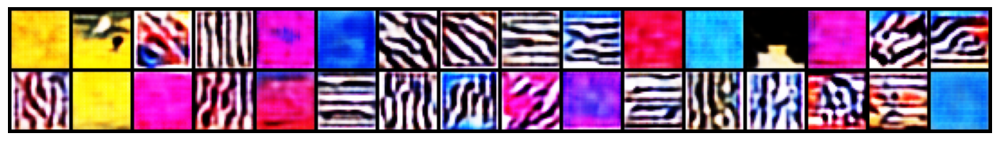

In [13]:
grid = vutils.make_grid([pt_decoder(conv_block1_latent[i].unsqueeze(0)).squeeze(0) for i in range(32)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Second Convolutional Block

In [14]:
net.conv_block2.register_forward_hook(capture('conv_block2'))
conv_block2_latent = optimize_hidden_layer_latent(net, pt_decoder, layers, num_features=64, layer_name='conv_block2', device=device, latent_size=512)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

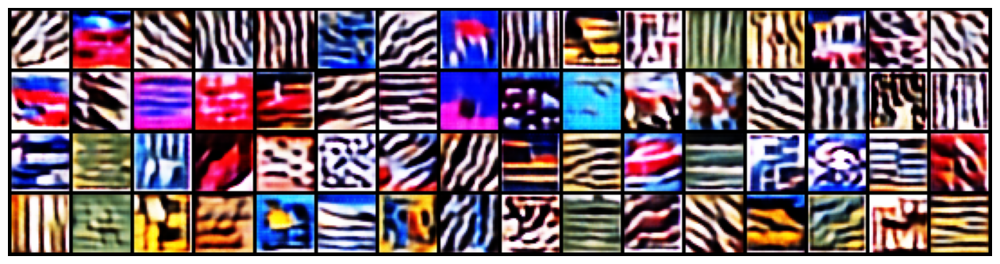

In [15]:
grid = vutils.make_grid([pt_decoder(conv_block2_latent[i].unsqueeze(0)).squeeze(0) for i in range(64)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Third Convolutional Block

In [16]:
net.conv_block3.register_forward_hook(capture('conv_block3'))
conv_block3_latent = optimize_hidden_layer_latent(net, pt_decoder, layers, num_features=128, layer_name='conv_block3', device=device, latent_size=512)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

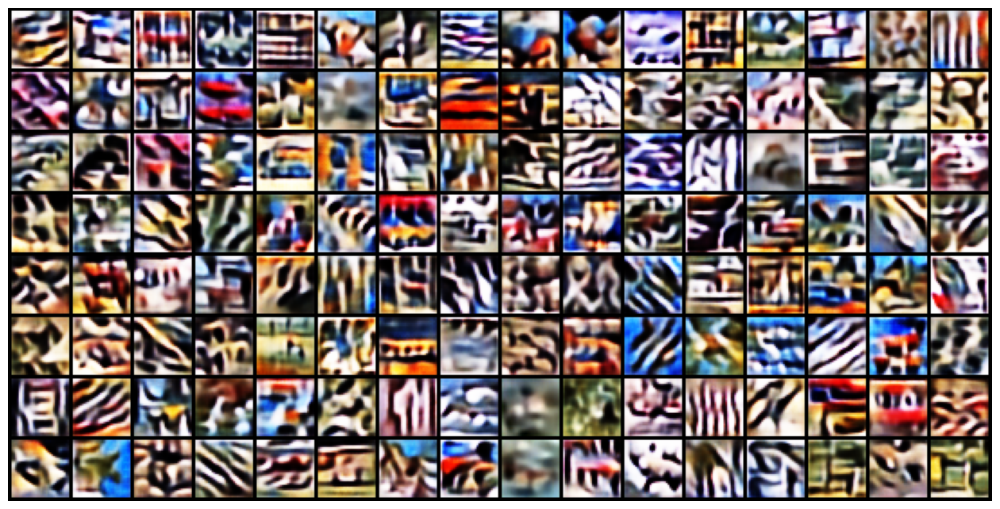

In [17]:
grid = vutils.make_grid([pt_decoder(conv_block3_latent[i].unsqueeze(0)).squeeze(0) for i in range(128)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Dense Layer

In [18]:
net.dense1.register_forward_hook(capture('dense1', apply_relu=True))
dense_layer_latent = optimize_hidden_layer_latent(net, pt_decoder, layers, num_features=256, layer_name='dense1',
                                           device=device, latent_size=512, apply_laplace_kernel=True, convolutional=False)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

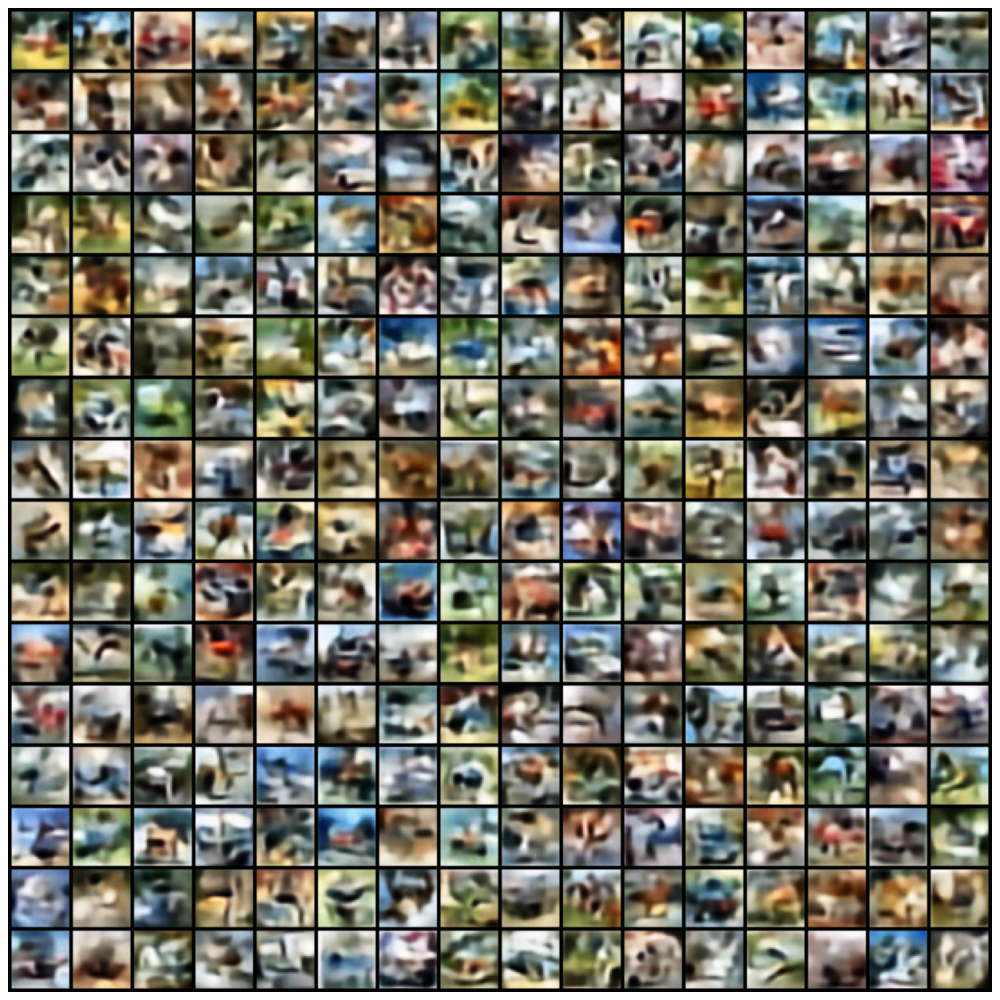

In [19]:
grid = vutils.make_grid([pt_decoder(dense_layer_latent[i].unsqueeze(0)).squeeze(0) for i in range(256)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Output Layer

In [20]:
output_latent = optimize_output_layer_latent(net, pt_decoder, num_features=10, device=device, latent_size=512, apply_laplace_kernel=True)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

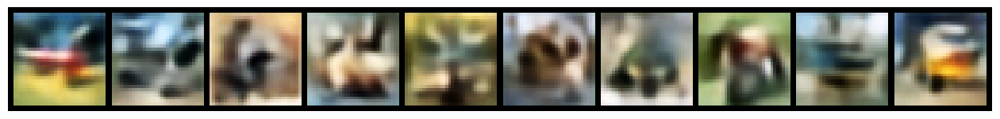

In [21]:
grid = vutils.make_grid([pt_decoder(output_latent[i].unsqueeze(0)).squeeze(0) for i in range(10)], nrow=10, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

## Optimization in Decorrelated Latent Space
A solution to the problem of trying to optimized latent varaibles that are correlated is to use a whitening matrix. This matrix can be obtained by performing ZCA on the latent representations of the training data and then using the eigenvectors and eigenvalues to decorrelate the latent space.

I start by loading the pre-trained encoder.

In [22]:
pt_encoder = Encoder(image_size = 32, latent_dim = 512)
pt_encoder.load_state_dict(torch.load("vae_encoder.pth"))
pt_encoder = pt_encoder.to(device)

The following code computes the latent representations of the training data in batches, because of memory constraints (Note: 20GB of memory was not enough to process the entire dataset at once, apply more splitting if necessary).

In [23]:
pt_encoder.eval()
tr_images_split = torch.split(tr_images, tr_images.size(0) // 4)
tr_latents = None

with torch.no_grad():
    for tr_images_batch in tr_images_split:
        tr_vectors = pt_encoder(tr_images_batch.to(device)).cpu()
        split_dim = tr_vectors.shape[-1] // 2
        if tr_latents is not None:
            tr_latents = torch.cat((tr_latents, tr_vectors[:, :split_dim]), dim=0)
        else:
            tr_latents = tr_vectors[:, :split_dim]

Below, I calculate the covariance matrix of the latent representations and use it to compute the whitening matrix. This matrix is then used to decorrelate the latent variables during optimization along with the mean latent representation.

In [24]:
tr_latents = tr_latents.to(device)
miu = tr_latents.mean(dim=0, keepdim=True).to(device)
tr_latents_centered = tr_latents - miu
cov = (tr_latents_centered.T @ tr_latents_centered) / (tr_latents_centered.size(0) - 1)

In [25]:
# clear memory
pt_encoder.conv_block1.conv1_out = None
pt_encoder.conv_block1.relu_out = None
pt_encoder.conv_block1.batch_norm_out = None
pt_encoder.conv_block2.conv1_out = None
pt_encoder.conv_block2.relu_out = None
pt_encoder.conv_block2.batch_norm_out = None
del tr_images_split
del tr_latents
del tr_latents_centered
gc.collect()
torch.cuda.empty_cache()

In [26]:
eigvals, eigvecs = torch.linalg.eigh(cov)
eps = 1e-5
eigvals = torch.clamp(eigvals, min=eps)
Lambda_sqrt = torch.diag(eigvals.pow(0.5))
W_inv = eigvecs @ Lambda_sqrt @ eigvecs.T
W_inv = W_inv.to(device)

### First Convolutional Block

In [27]:
net.conv_block1.register_forward_hook(capture('conv_block1'))
conv_block1_decorr_latent = optimize_hidden_layer_decorr_latent(net, pt_decoder, layers, num_features=32, layer_name='conv_block1',
                                                                device=device, latent_size=512, miu=miu, W_inv=W_inv)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

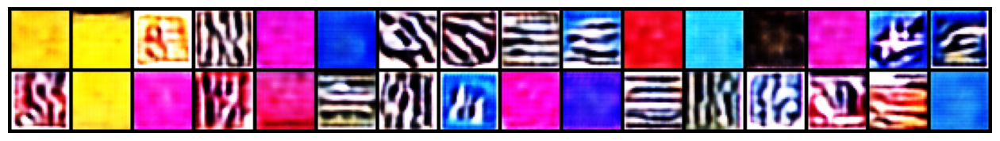

In [28]:
grid = vutils.make_grid([pt_decoder((conv_block1_decorr_latent[i] @ W_inv + miu).unsqueeze(0)).squeeze(0) for i in range(32)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Second Convolutional Block

In [29]:
net.conv_block2.register_forward_hook(capture('conv_block2'))
conv_block2_decorr_latent = optimize_hidden_layer_decorr_latent(net, pt_decoder, layers, num_features=64, layer_name='conv_block2',
                                                                device=device, latent_size=512, miu=miu, W_inv=W_inv)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

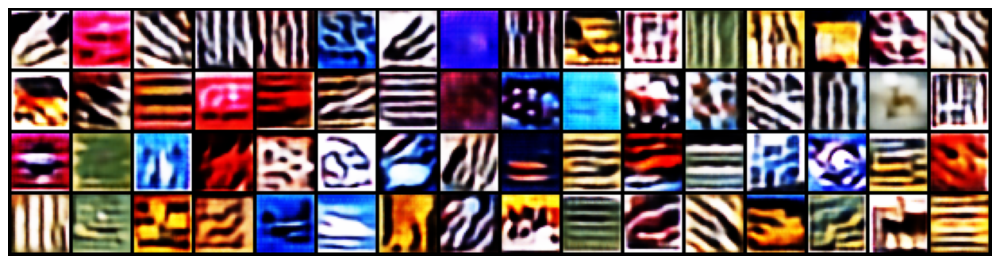

In [30]:
grid = vutils.make_grid([pt_decoder((conv_block2_decorr_latent[i] @ W_inv + miu).unsqueeze(0)).squeeze(0) for i in range(64)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Third Convolutional Block

In [31]:
net.conv_block3.register_forward_hook(capture('conv_block3'))
conv_block3_decorr_latent = optimize_hidden_layer_decorr_latent(net, pt_decoder, layers, num_features=128, layer_name='conv_block3',
                                                  device=device, latent_size=512, miu=miu, W_inv=W_inv)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

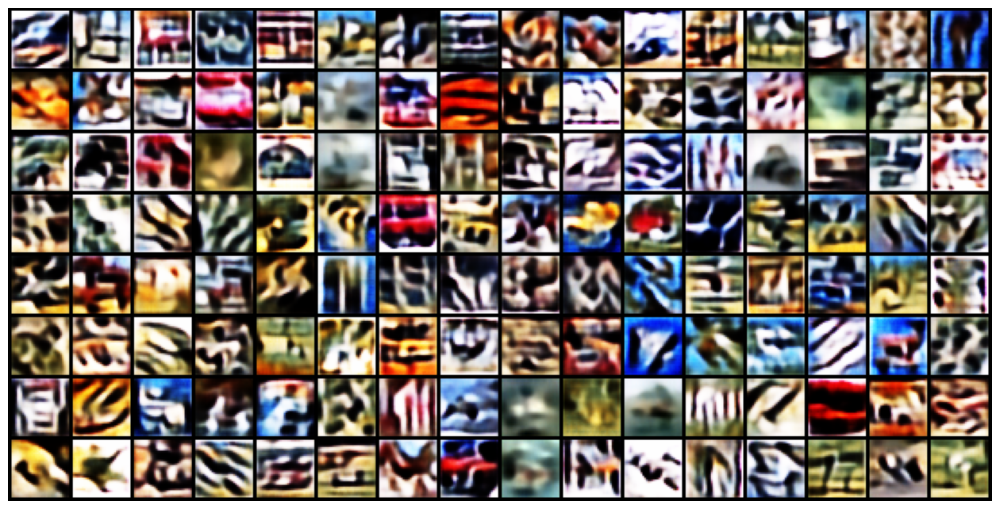

In [32]:
grid = vutils.make_grid([pt_decoder((conv_block3_decorr_latent[i] @ W_inv + miu).unsqueeze(0)).squeeze(0) for i in range(128)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Dense Layer

In [33]:
net.dense1.register_forward_hook(capture('dense1', apply_relu=True))
dense_layer_decorr_latent = optimize_hidden_layer_decorr_latent(net, pt_decoder, layers, num_features=256, layer_name='dense1',
                                           device=device, latent_size=512, apply_laplace_kernel=True, miu=miu, W_inv=W_inv, convolutional=False)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

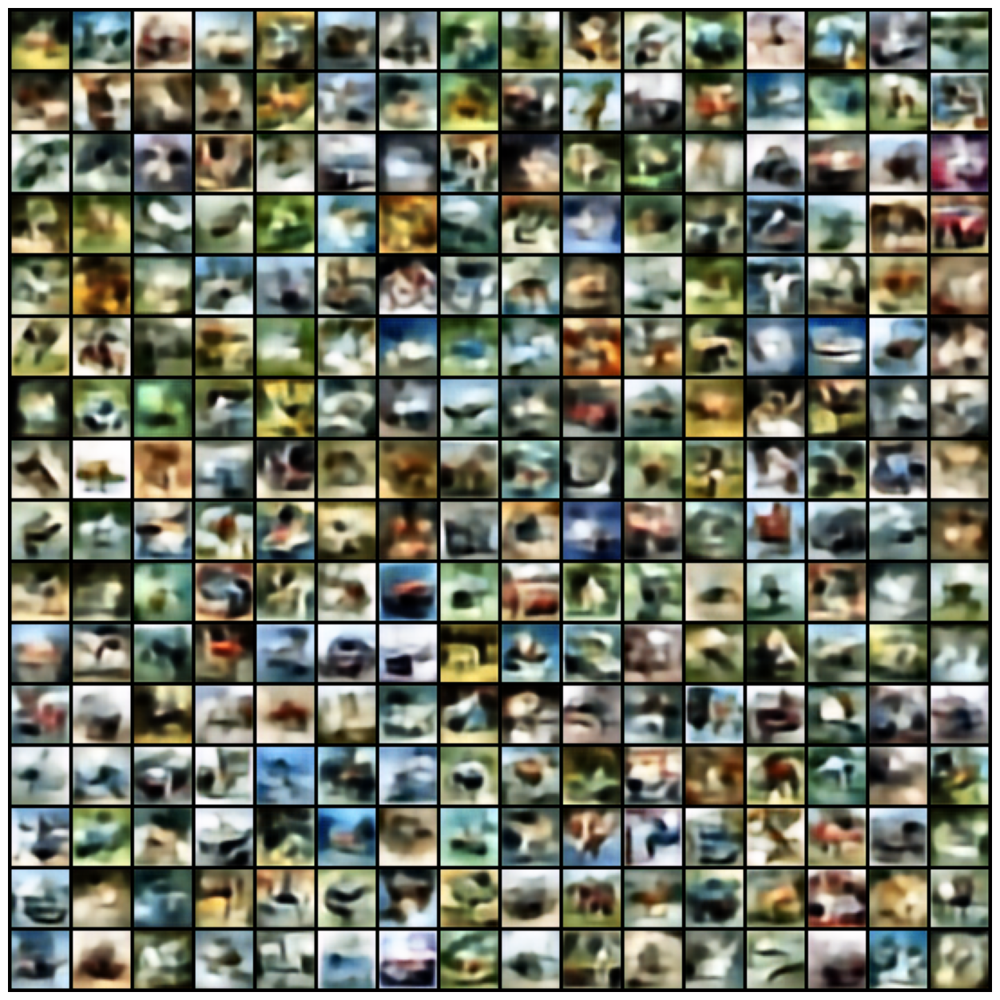

In [34]:
grid = vutils.make_grid([pt_decoder((dense_layer_decorr_latent[i] @ W_inv + miu).unsqueeze(0)).squeeze(0) for i in range(256)], nrow=16, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()

### Output Layer

In [35]:
output_decorr_latent = optimize_output_layer_decorr_latent(net, pt_decoder, num_features=10, device=device, latent_size=512, apply_laplace_kernel=True, miu=miu, W_inv=W_inv)
for handle in net._forward_hooks.values():
    handle.remove()
layers = {}

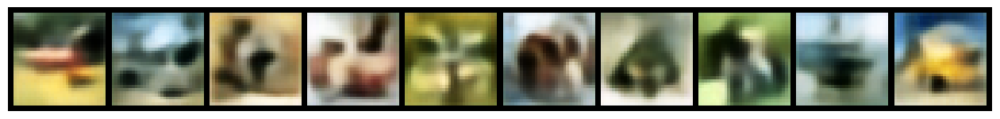

In [36]:
grid = vutils.make_grid([pt_decoder((output_decorr_latent[i] @ W_inv + miu.to(device)).unsqueeze(0)).squeeze(0) for i in range(10)], nrow=10, normalize=True, scale_each=True)
plt.figure(figsize=(16,16))
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.axis('off')
plt.show()